# ***ANÁLISIS EXPLORATORIO DE DATOS (EDA)***

## *ÍNDICE:* 
---
0. INTRODUCCIÓN
1. **ANÁLISIS EXPLORATORIO DE DATOS (EDA)**
    - [1.1. Acondicionamiento bases de datos](#11)
    - [1.2. Análisis visual](#12)
    - [1.3. Análisis estadístico](#13)   
2. MACHINE LEARNING
    - 2.1. Preparación y limpieza de datos
    - 2.2. Feature Engineering
    - 2.3. Modelado
3. RESULTADOS
    - 3.1. Visualización y reporting de los resultados
    - 3.2. Creación de un pipeline para el flujo automatizado
---

In [8]:
# Librery
from utils.libreries import *
%matplotlib inline


##  **1.1. Acondicionamiento bases de datos**<a id='11'></a>

In [9]:
# Read all csv 
preroot=os.getcwd()
df=pd.read_csv(preroot+'/data/raw/waterQuality.csv')
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

In [10]:
# Transform all object columns to numeric:
df.ammonia=[float(i) if (i!='#NUM!') else np.nan for i in df.ammonia]
df.is_safe=[int(i) if (i!='#NUM!') else np.nan for i in df.is_safe]


In [11]:
df.isna().sum()*100/len(df)

aluminium      0.000000
ammonia        0.037505
arsenic        0.000000
barium         0.000000
cadmium        0.000000
chloramine     0.000000
chromium       0.000000
copper         0.000000
flouride       0.000000
bacteria       0.000000
viruses        0.000000
lead           0.000000
nitrates       0.000000
nitrites       0.000000
mercury        0.000000
perchlorate    0.000000
radium         0.000000
selenium       0.000000
silver         0.000000
uranium        0.000000
is_safe        0.037505
dtype: float64

In [13]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7996 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7996 non-null   float64
 1   ammonia      7996 non-null   float64
 2   arsenic      7996 non-null   float64
 3   barium       7996 non-null   float64
 4   cadmium      7996 non-null   float64
 5   chloramine   7996 non-null   float64
 6   chromium     7996 non-null   float64
 7   copper       7996 non-null   float64
 8   flouride     7996 non-null   float64
 9   bacteria     7996 non-null   float64
 10  viruses      7996 non-null   float64
 11  lead         7996 non-null   float64
 12  nitrates     7996 non-null   float64
 13  nitrites     7996 non-null   float64
 14  mercury      7996 non-null   float64
 15  perchlorate  7996 non-null   float64
 16  radium       7996 non-null   float64
 17  selenium     7996 non-null   float64
 18  silver       7996 non-null   float64
 19  uraniu

In [14]:
df.isna().sum()*100/len(df)

aluminium      0.0
ammonia        0.0
arsenic        0.0
barium         0.0
cadmium        0.0
chloramine     0.0
chromium       0.0
copper         0.0
flouride       0.0
bacteria       0.0
viruses        0.0
lead           0.0
nitrates       0.0
nitrites       0.0
mercury        0.0
perchlorate    0.0
radium         0.0
selenium       0.0
silver         0.0
uranium        0.0
is_safe        0.0
dtype: float64

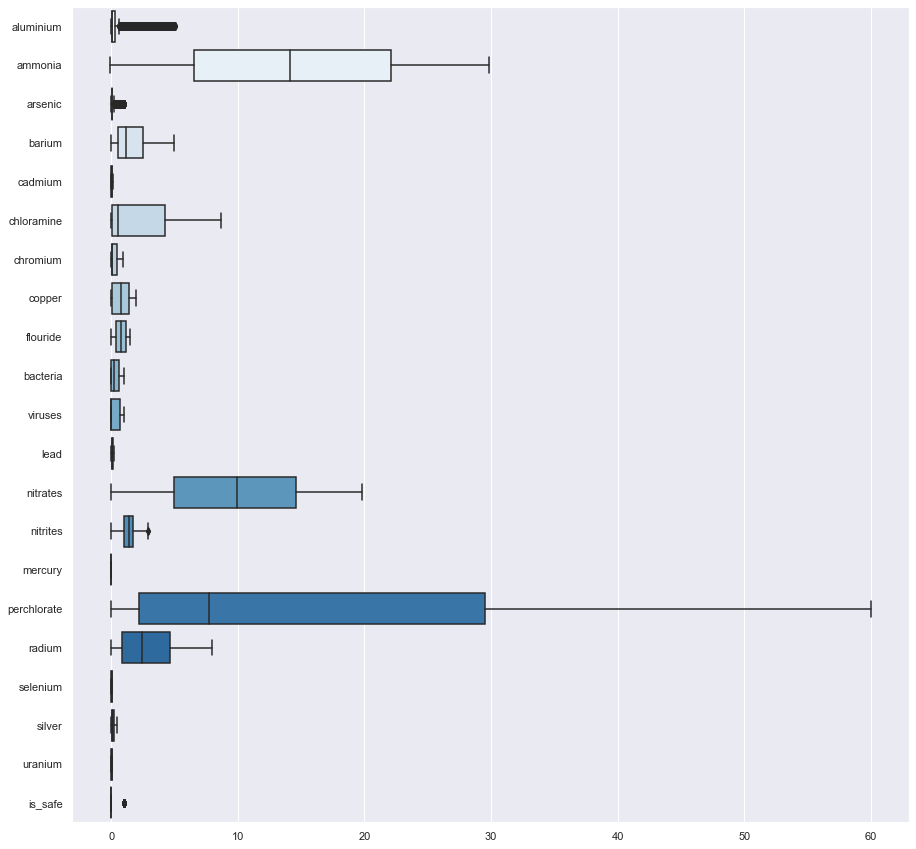

In [15]:
plt.style.use('ggplot')
sns.set(rc={'figure.figsize':(15, 15)})
sns.boxplot(data=df,orient='h',palette='Blues');

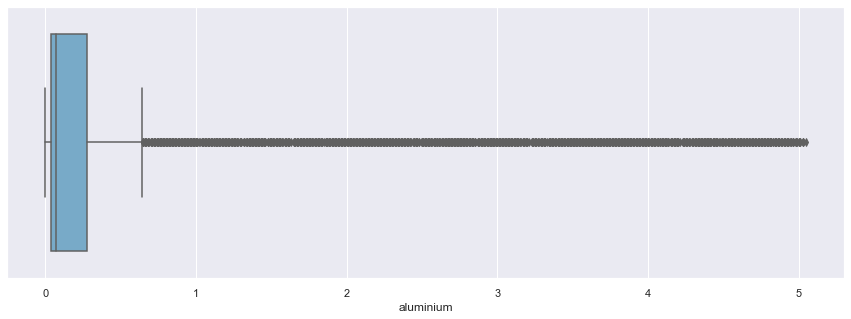

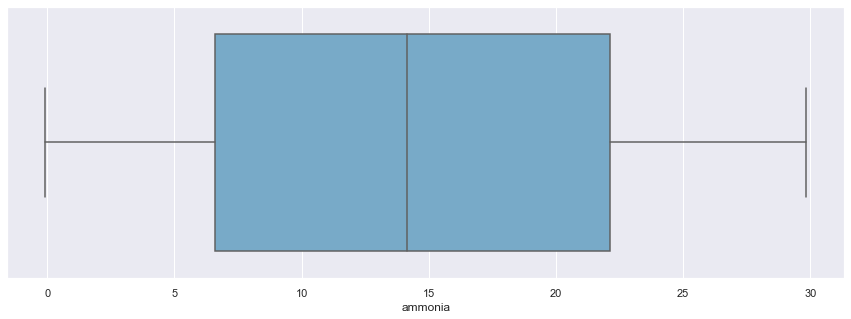

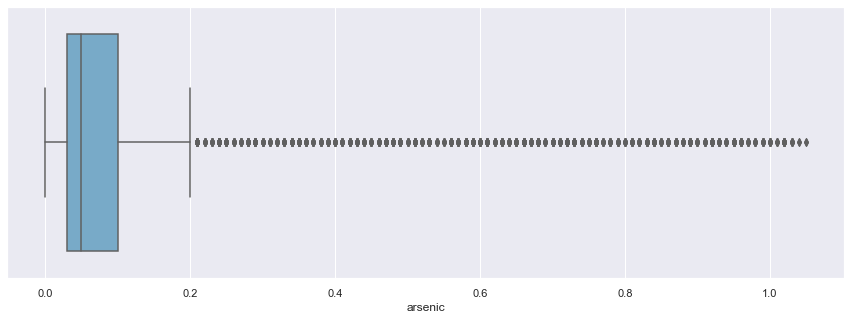

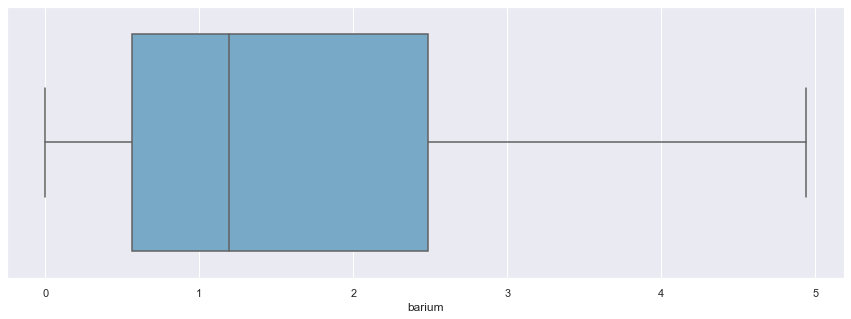

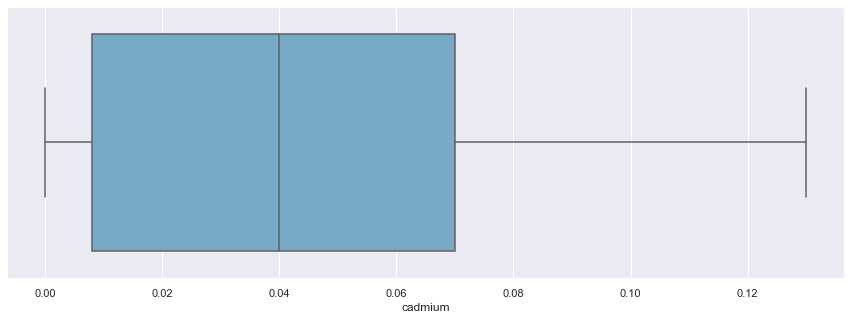

...

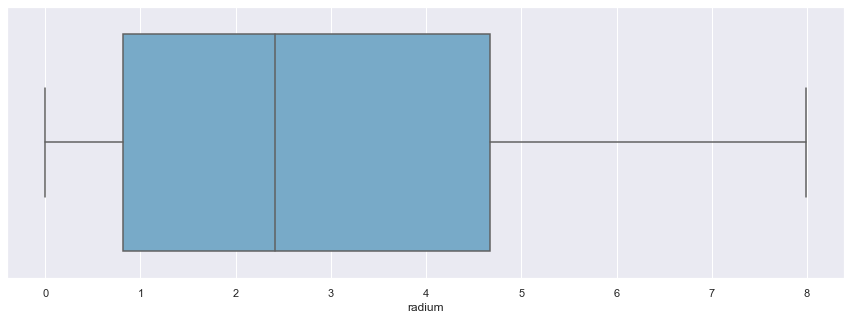

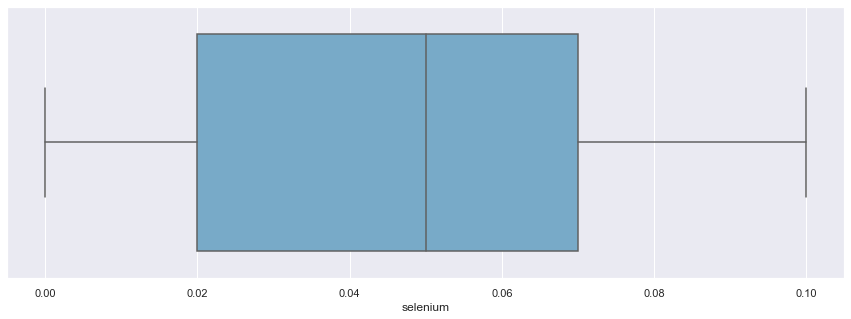

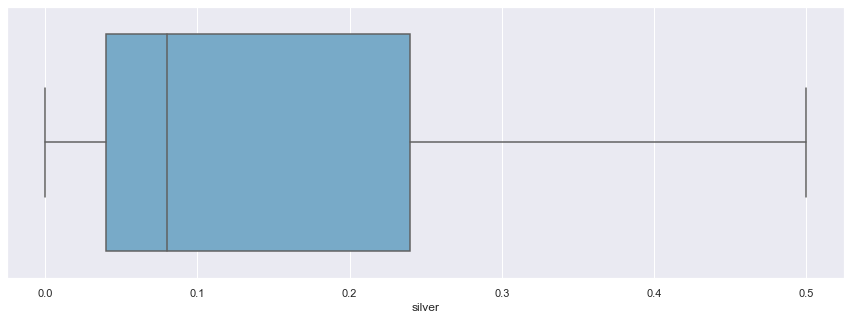

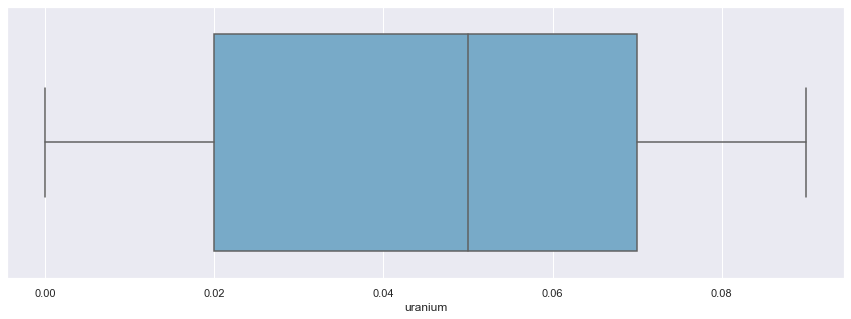

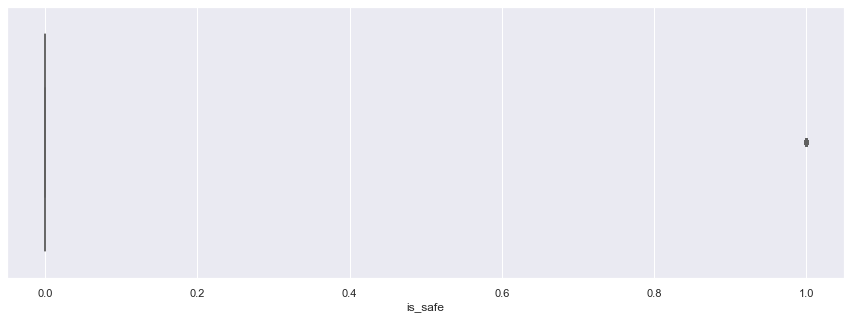

In [16]:
sns.set(rc={'figure.figsize':(15, 5)})
for i in df.columns:
    sns.boxplot(data=df,x=df[i],orient='h',palette='Blues');

    plt.show()

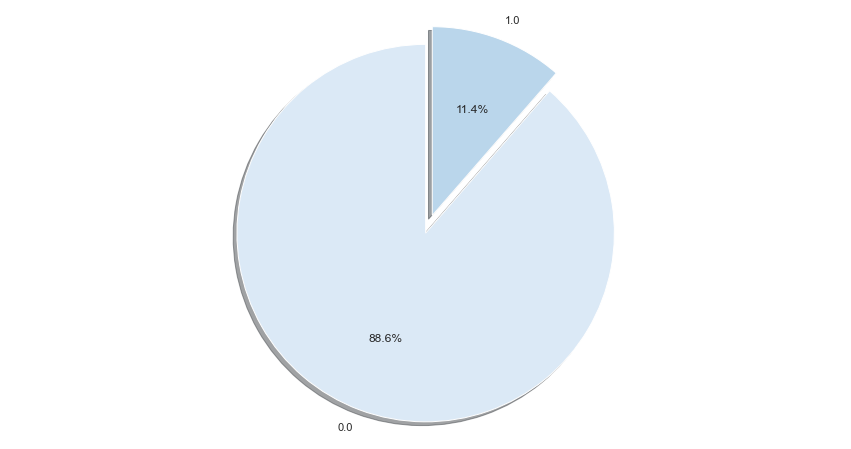

<AxesSubplot:xlabel='is_safe', ylabel='count'>

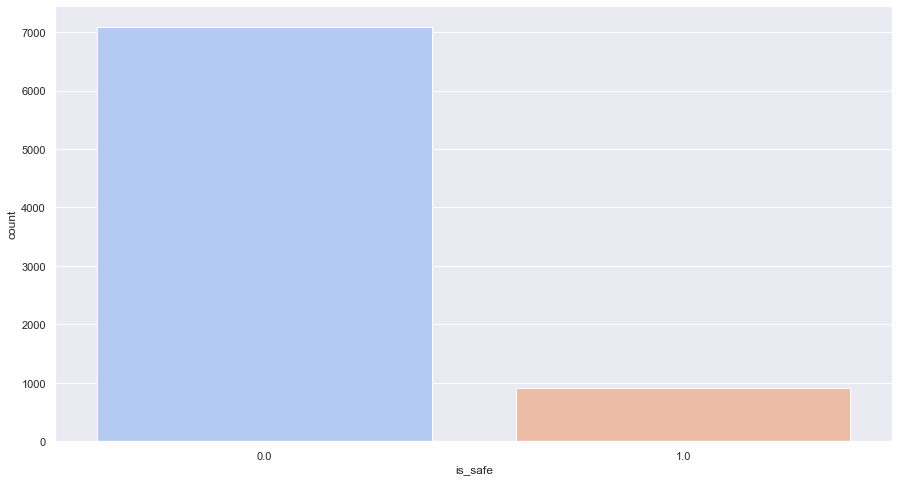

In [17]:
sns.set(rc={'figure.figsize':(15, 8)})
colors = sns.color_palette("Blues")

labels = df.is_safe.value_counts().index
sizes = df.is_safe.value_counts()
explode = (0, 0.1)  

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels,colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal') 
plt.show()

sns.set(rc={'figure.figsize':(15, 8)})
sns.countplot(x='is_safe',data=df,palette="coolwarm")

##  **1.2. Análisis visual**<a id='12'></a>

<Figure size 1728x1728 with 0 Axes>

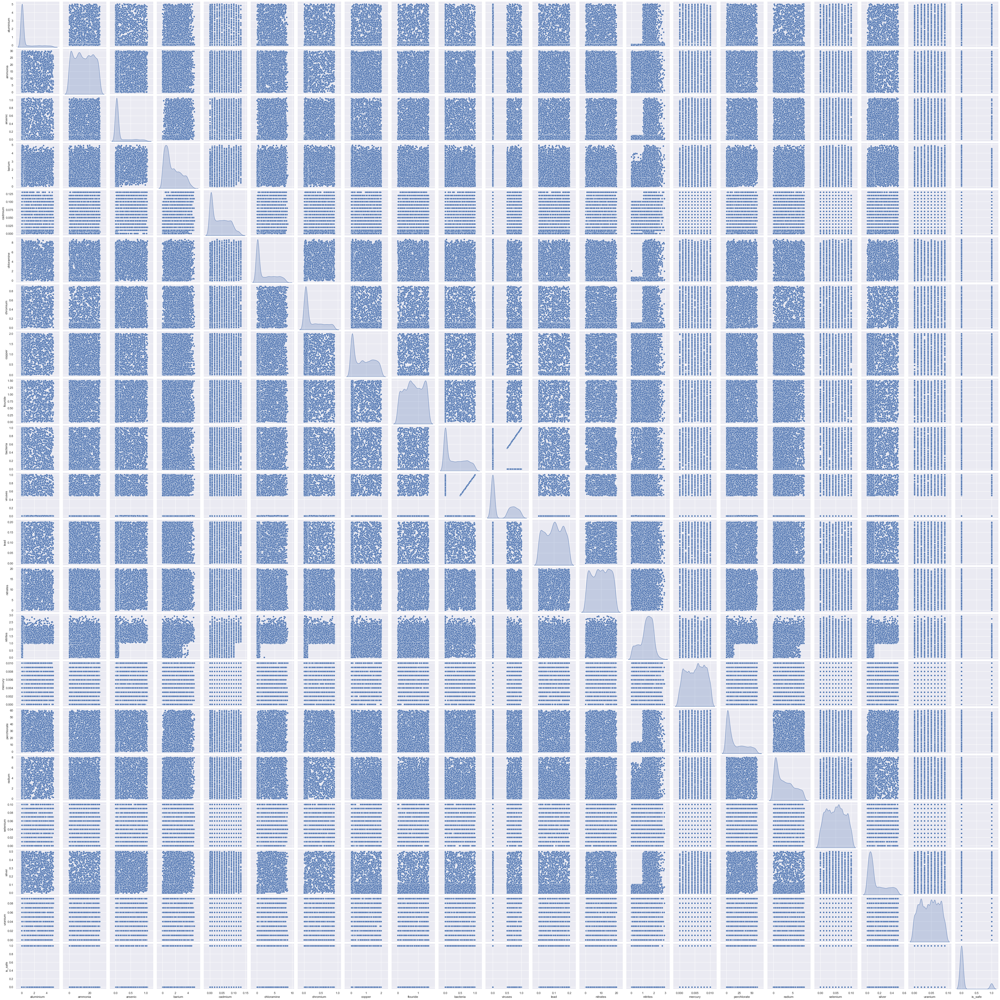

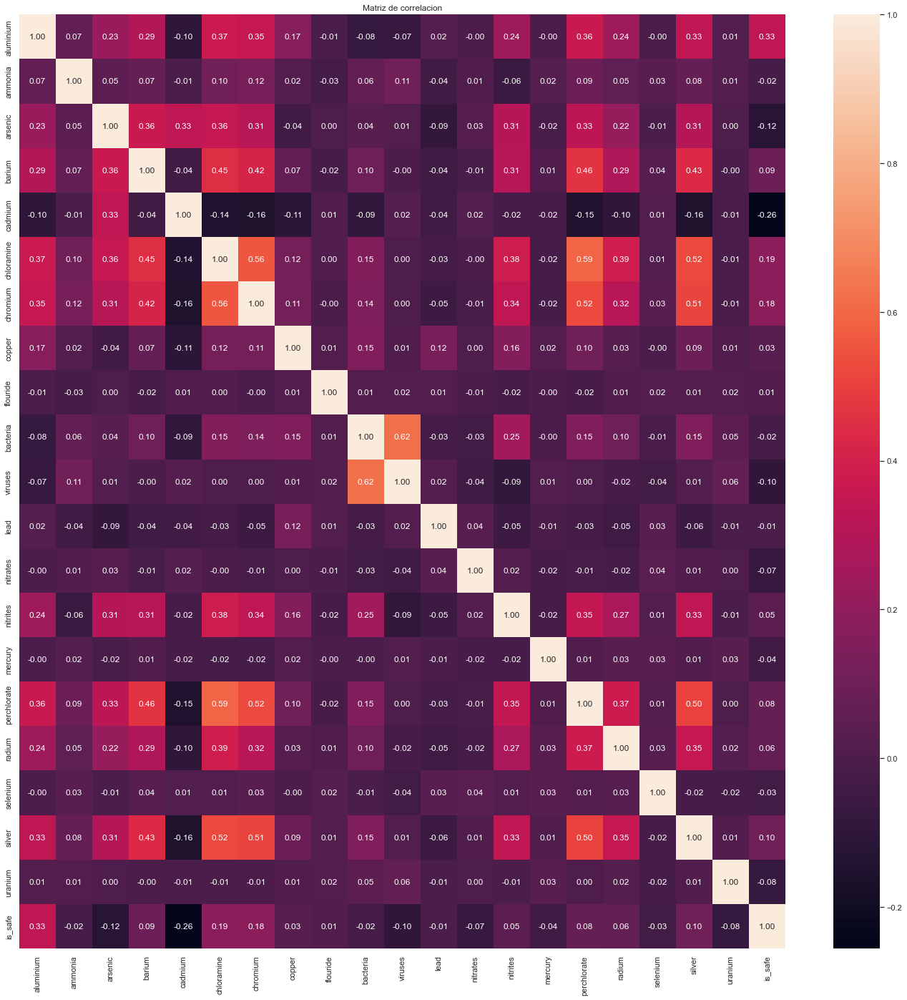

In [18]:
fig = plt.figure(figsize=(24, 24))
sns.pairplot(df,diag_kind='kde',palette='coolwarm')
correlations = df.corr(method='pearson')
fig = plt.figure(figsize=(24, 24))
sns.heatmap(correlations, annot=True, fmt='.2f')
plt.title('Matriz de correlacion')
plt.show()


interval columns not set, guessing: ['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver', 'uranium', 'is_safe']


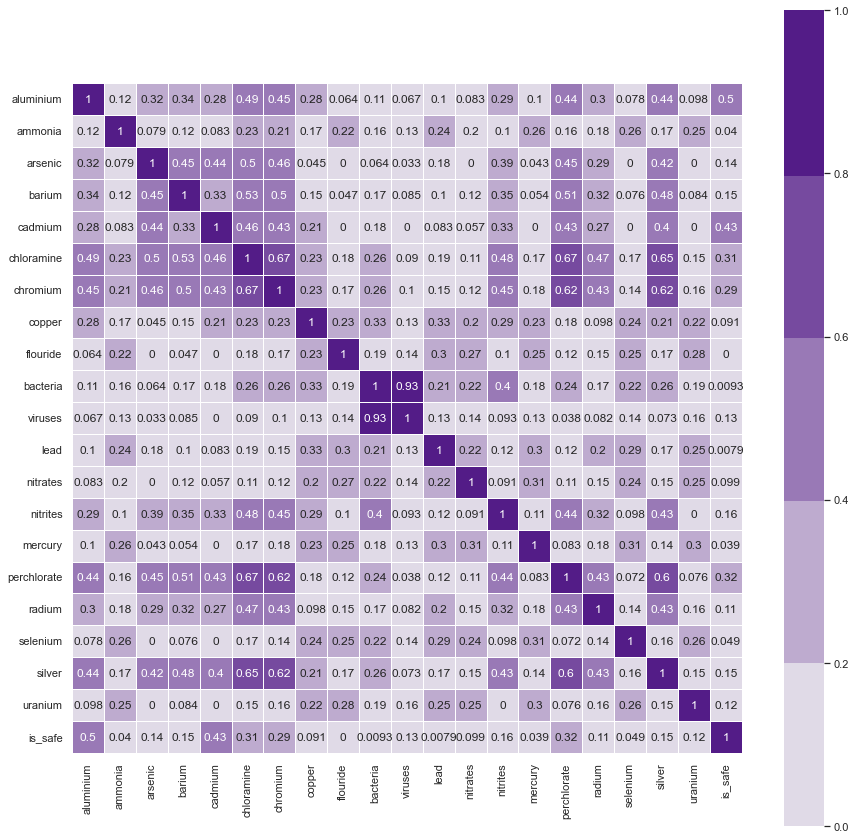

In [19]:
# Graphics: correlation
phik_matrix = df.phik_matrix()

plt.figure(figsize=(15,15))
sns.heatmap(phik_matrix,
            vmin=0,
            vmax=1,
            center=0,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=10),
            square=True,
            annot=True,
            linewidths=.5);

***OBSERVACIONES:***

---
~~~
1. Se observa las variables con mayor correlación con respecto a la variable objetivo, o variable dependiente:
    - Aluminium
    - Cadmium
    - Chloromine
    - Chromium
    - Perchlorate

    
2. Se observan la correlación de algunas variables independientes con otras, pudiendo ser alguna de ellas eliminada para evitar la multicolinealidad. Ej. Chromium y Chloromine: fuerte correlación entre ellas, siendo una prescindible.

~~~
---


##  **1.3. Análisis estadístico**<a id='13'></a>